# Artificial Neural Network Project

In [1]:
# import libraries

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [4]:
pwd

'C:\\Users\\DOREEN DOMPREH\\Desktop'

In [6]:
# load dataset
df = pd.read_csv('Customer_Churn_Modelling-Copy1.csv', header=0)

In [7]:
df.head()

,RowNumber,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,1,15634602,Hargrave,619,France,Female,42,2,0.00,1,1,1,101348.88,1
1,2,15647311,Hill,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0
2,3,15619304,Onio,502,France,Female,42,8,159660.80,3,1,0,113931.57,1
3,4,15701354,Boni,699,France,Female,39,1,0.00,2,0,0,93826.63,0
4,5,15737888,Mitchell,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0


In [32]:
x = df.iloc[:,3:-1]
x.head()

,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary
0,619,France,Female,42,2,0.00,1,1,1,101348.88
1,608,Spain,Female,41,1,83807.86,1,0,1,112542.58
2,502,France,Female,42,8,159660.80,3,1,0,113931.57
3,699,France,Female,39,1,0.00,2,0,0,93826.63
4,850,Spain,Female,43,2,125510.82,1,1,1,79084.10


In [12]:
y = df['Exited']
y.head()

0    1
1    0
2    1
3    0
4    0
Name: Exited, dtype: int64

# Data Visualization

In [33]:
x.columns

Index(['CreditScore', 'Geography', 'Gender', 'Age', 'Tenure', 'Balance',
       'NumOfProducts', 'HasCrCard', 'IsActiveMember', 'EstimatedSalary'],
      dtype='object')

In [13]:
# plot quality against targetted output (y)

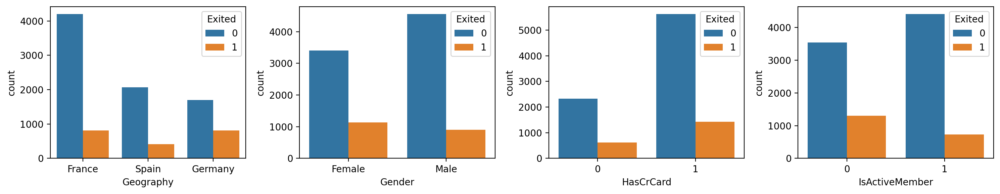

In [34]:
plt.rcParams['figure.figsize'] = (15, 3)
plt.rcParams['figure.dpi'] = 200

fig,ax = plt.subplots(1, 4)

sns.countplot(x='Geography', data=x, ax=ax[0], hue=y)
sns.countplot(x='Gender', data=x, ax=ax[1], hue=y)
sns.countplot(x='HasCrCard', data=x, ax=ax[2], hue=y)
sns.countplot(x='IsActiveMember', data=x, ax=ax[3], hue=y)

plt.tight_layout()

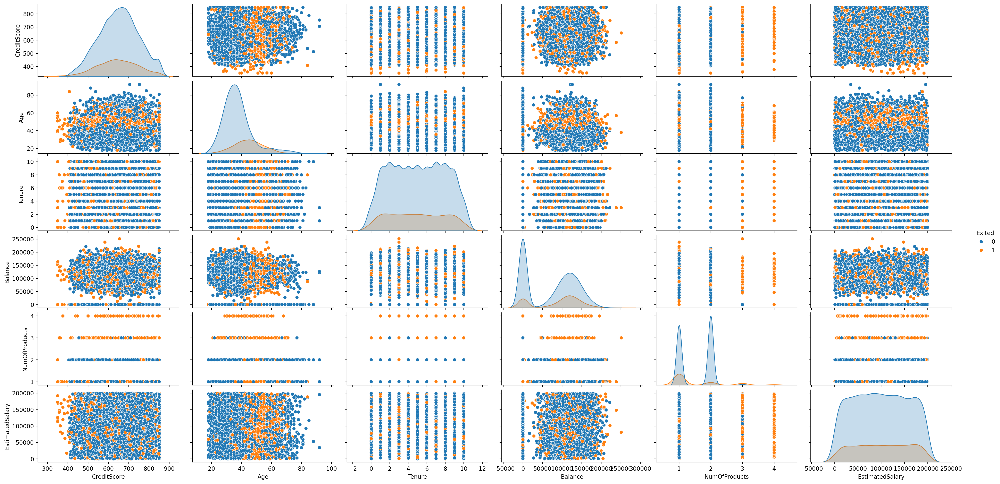

In [17]:
# using pairplot to see the relation between each variable and the tragetted output
sns.pairplot(df, vars=['CreditScore','Age', 'Tenure', 'Balance', 'NumOfProducts', 'EstimatedSalary'], height=2, aspect=2, hue='Exited')

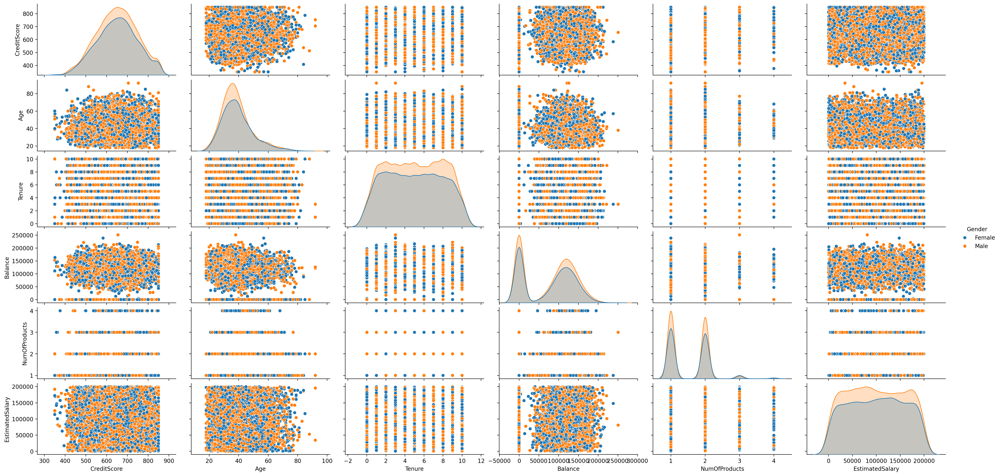

In [19]:
# using pairplot to see the relation between each variable and the gender variable

sns.pairplot(df, vars=['CreditScore','Age', 'Tenure', 'Balance', 'NumOfProducts', 'EstimatedSalary'], height=2, aspect=2, hue='Gender')

# Train_test_split

In [20]:
# import libraries

In [24]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

In [39]:
x_encoded = pd.get_dummies(x, drop_first=True).astype(int)

In [40]:
x_train, x_test, y_train, y_test = train_test_split(x_encoded, y,test_size=0.2, stratify=y, random_state=0)

In [42]:
x_train.head()

,CreditScore,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Geography_Germany,Geography_Spain,Gender_Male
493,531,47,6,0,1,0,0,194998,0,0,0
6839,724,36,6,94615,2,1,1,10627,1,0,1
170,484,29,4,130114,1,1,0,164017,0,0,0
4958,655,37,6,109093,2,1,0,1775,0,0,1
4271,465,33,5,0,2,0,1,78698,0,0,1


In [43]:
sc = StandardScaler()
x_train = sc.fit_transform(x_train)
x_test = sc.transform(x_test)

In [50]:
input_shape = x_train.shape[1:]

# Build Neural Model

In [44]:
# import libraries

In [47]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Flatten, Dense, InputLayer
from sklearn.metrics import confusion_matrix
from tensorflow.keras.optimizers import Adam

In [51]:
Model = Sequential()
Model.add(InputLayer(input_shape))
Model.add(Dense(128, activation='relu', kernel_initializer='uniform'))
Model.add(Dense(128, activation='relu', kernel_initializer='uniform'))
Model.add(Dense(1, activation='sigmoid', kernel_initializer='uniform'))


In [52]:
Model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 128)               1536      
                                                                 
 dense_1 (Dense)             (None, 128)               16512     
                                                                 
 dense_2 (Dense)             (None, 1)                 129       
                                                                 
Total params: 18177 (71.00 KB)
Trainable params: 18177 (71.00 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [53]:
Model.compile(optimizer=Adam(learning_rate=0.001), loss='binary_crossentropy', metrics='accuracy')

In [55]:
history = Model.fit(x_train, y_train, epochs=10, validation_split=0.1, batch_size=8)

Epoch 1/10
900/900 [==============================] - 2s 3ms/step - loss: 0.3247 - accuracy: 0.8660 - val_loss: 0.3426 - val_accuracy: 0.8687
Epoch 2/10
900/900 [==============================] - 2s 3ms/step - loss: 0.3223 - accuracy: 0.8683 - val_loss: 0.3386 - val_accuracy: 0.8587
Epoch 3/10
900/900 [==============================] - 2s 2ms/step - loss: 0.3188 - accuracy: 0.8683 - val_loss: 0.3436 - val_accuracy: 0.8600
Epoch 4/10
900/900 [==============================] - 2s 2ms/step - loss: 0.3165 - accuracy: 0.8692 - val_loss: 0.3501 - val_accuracy: 0.8587
Epoch 5/10
900/900 [==============================] - 2s 2ms/step - loss: 0.3134 - accuracy: 0.8708 - val_loss: 0.3560 - val_accuracy: 0.8600
Epoch 6/10
900/900 [==============================] - 2s 2ms/step - loss: 0.3115 - accuracy: 0.8696 - val_loss: 0.3378 - val_accuracy: 0.8625
Epoch 7/10
900/900 [==============================] - 2s 2ms/step - loss: 0.3096 - accuracy: 0.8718 - val_loss: 0.3508 - val_accuracy: 0.8562
Epoch 

In [56]:
hist = pd.DataFrame(history.history)

In [57]:
hist

,loss,accuracy,val_loss,val_accuracy
0,0.324668,0.865972,0.342630,0.86875
1,0.322332,0.868333,0.338587,0.85875
2,0.318839,0.868333,0.343578,0.86000
3,0.316476,0.869167,0.350132,0.85875
4,0.313407,0.870833,0.355961,0.86000
5,0.311493,0.869583,0.337815,0.86250
6,0.309634,0.871806,0.350810,0.85625
7,0.309040,0.872083,0.349607,0.86000
8,0.301961,0.873472,0.348758,0.86000
9,0.300416,0.876667,0.352200,0.86000


<Axes: >

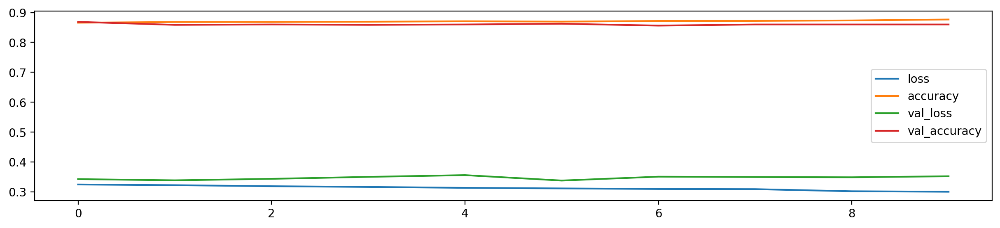

In [58]:
hist.plot()

# y_pred

In [59]:
y_pred = Model.predict(x_test)

63/63 [==============================] - 0s 2ms/step


In [63]:
y_pred = (y_pred > 0.5).astype(int)

In [64]:
cm = confusion_matrix(y_test, y_pred)
cm

array([[1514,   79],
       [ 218,  189]], dtype=int64)

In [65]:
accuracy = (cm[0][0] + cm[1][1]) / (cm[0][1] + cm[1][0] + cm[0][0] + cm[1][1])

In [66]:
print(accuracy)

0.8515


# Model save and load

In [67]:
import pickle
import os

In [68]:
os.makedirs('Model', exist_ok=True)

In [69]:
Model.save('Model/ANN1')

INFO:tensorflow:Assets written to: Model/ANN1\assets


INFO:tensorflow:Assets written to: Model/ANN1\assets


In [70]:
pickle.dump(sc, open('Model/sc.pkl', 'wb'))

In [71]:
Model1 = keras.models.load_model('Model/ANN1')

In [72]:
sc1 = pickle.load(open('Model/sc.pkl', 'rb'))

# Final Prediction in Real Life

In [74]:
x_test[0]

array([-1.975956  ,  0.1093321 ,  0.35390313,  0.68530193,  0.81371262,
        0.64531434, -1.03849022, -0.15254916,  1.72974448, -0.57504086,
       -1.09665089])

In [75]:
x_encoded.columns

Index(['CreditScore', 'Age', 'Tenure', 'Balance', 'NumOfProducts', 'HasCrCard',
       'IsActiveMember', 'EstimatedSalary', 'Geography_Germany',
       'Geography_Spain', 'Gender_Male'],
      dtype='object')

In [76]:
x_encoded.iloc[0]

CreditScore             619
Age                      42
Tenure                    2
Balance                   0
NumOfProducts             1
HasCrCard                 1
IsActiveMember            1
EstimatedSalary      101348
Geography_Germany         0
Geography_Spain           0
Gender_Male               0
Name: 0, dtype: int32

In [79]:
test = list(x_encoded.iloc[0].values)
test

[619, 42, 2, 0, 1, 1, 1, 101348, 0, 0, 0]

In [101]:
test = [[419, 22, 2, 0, 1, 1, 1, 0, 0, 0, 1]]

In [102]:
test = sc.transform(test)

C:\Users\DOREEN DOMPREH\anaconda3\lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


In [103]:
Model.predict(test)

1/1 [==============================] - 0s 31ms/step


array([[0.05598434]], dtype=float32)

In [104]:
(Model.predict(test)>0.5).astype(int)

1/1 [==============================] - 0s 27ms/step


array([[0]])